# Computer Vision color spaces

### Import statements

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [1]:
def imshow(img, grayscale = False):
    plt.figure(figsize = (20,15));
    if grayscale:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img[:,:,::-1])    

### To edit an image making a copy of it is always a good idea!

In [4]:
# Load an image
# And make a copy of the original image to avoid manipulating the original image
path = 'img/blue-flowers.jpg'

image = cv2.imread(path)
image.shape
c_image =image.copy()


[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [4]:
# Load a color image and split in is different B, G and R channels

b,g,r = cv2.split(c_image)

print(b)
print(g)
print(r)

[[ 33  43  41 ... 250 245 242]
 [  1   0   3 ... 248 246 243]
 [ 34  30  38 ... 245 241 241]
 ...
 [ 16  22  24 ... 125  51  49]
 [ 32  18   6 ...  30   0  45]
 [ 19  20  22 ...  76  54  45]]
[[ 48  63  70 ... 184 185 187]
 [ 40  43  52 ... 184 186 188]
 [102  98 109 ... 188 188 188]
 ...
 [ 12  12  12 ...  37  31  54]
 [ 20  14  10 ...  26  10  47]
 [ 17  18  20 ...  24  81 120]]
[[ 10  21  24 ... 149 149 150]
 [  0   0   2 ... 154 156 157]
 [ 49  45  53 ... 162 161 161]
 ...
 [ 11  12  10 ...  13   0  23]
 [ 20  13   5 ...   0   0  28]
 [  7   8  10 ...   0  38  69]]


[Hint](# "cv2.split") 

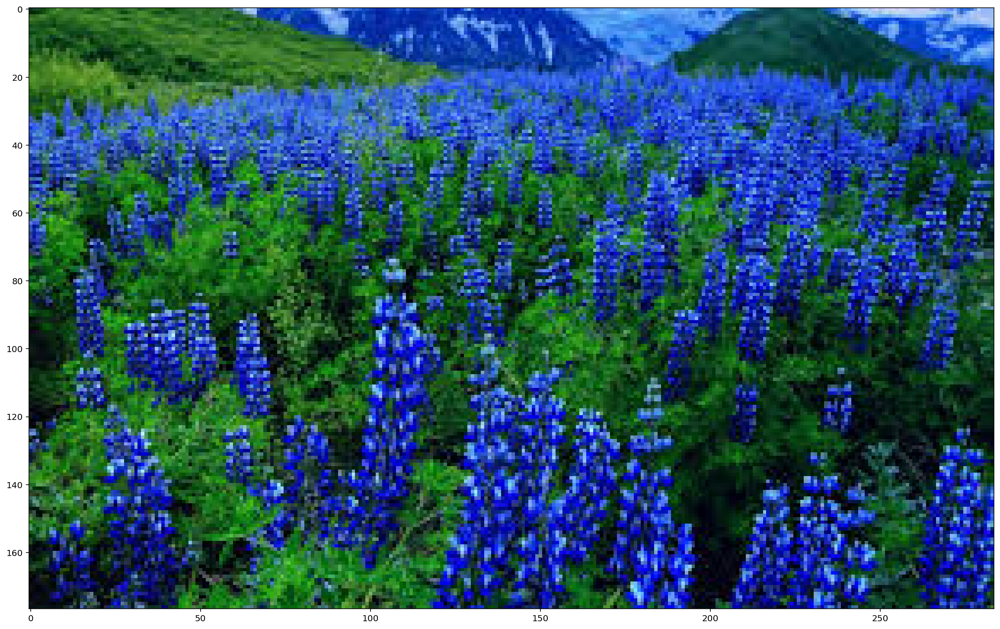

In [5]:
# Show each channel channel on screen

imshow(c_image)

#### Merging the color channels

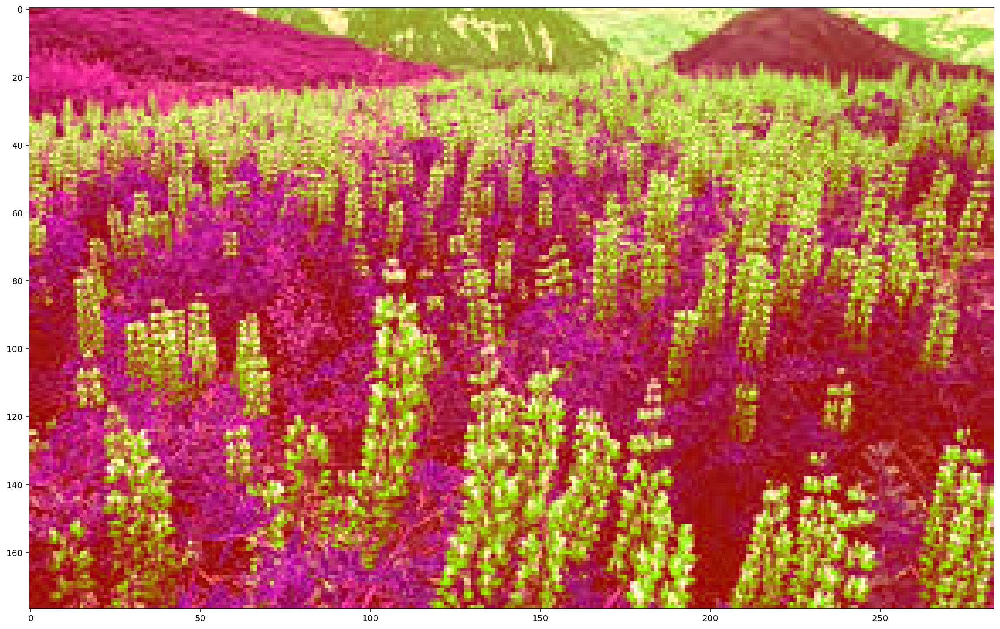

In [6]:
# Modify a channel and then merge them all again



#adding some colors

r = cv2.add(r,150)
merged = cv2.merge([g,b,r])
imshow(merged)

[Hint](# "cv2.merge") 

(1600, 2560, 3)
(1600, 2560, 3)


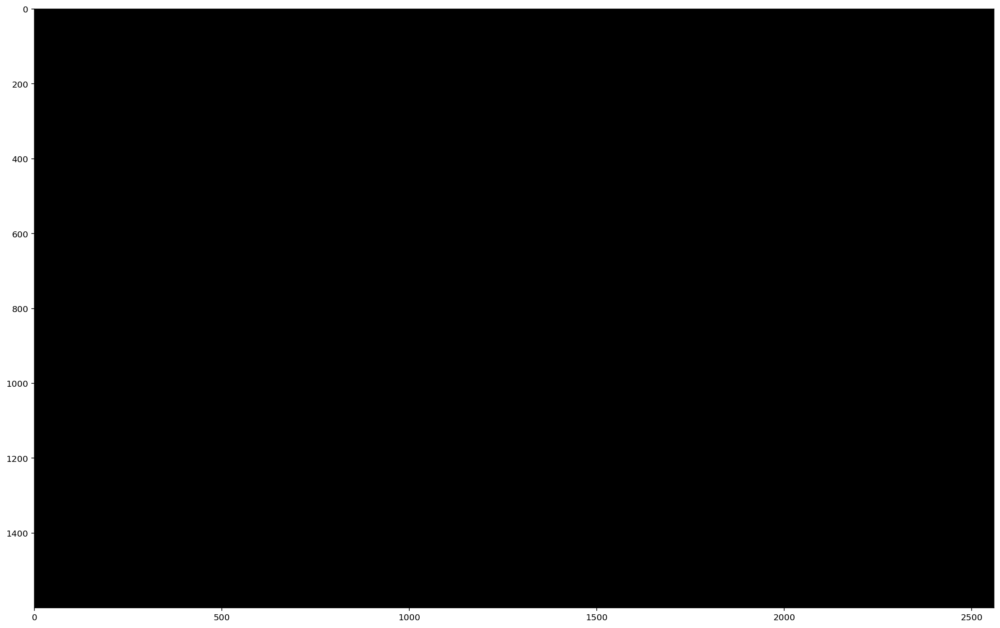

In [32]:
# Create a black canvas with the same size as the image you loaded

img = cv2.imread('img/purple-flowers.jpg')

c_img = img.copy()

canvas = np.zeros((1600,2560,3), dtype = 'uint8')

print(img.shape)
print(canvas.shape)

imshow(canvas)

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

In [ ]:


# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine
b,g,r = cv2.split(canvas)

b = cv2.add(b, 150) 
merged = cv2.merge([r,g,b])
imshow(merged)

[Hint](# "cv2.merge") 

### HSV: Hue Saturation Value

#### M&Ms challenge!

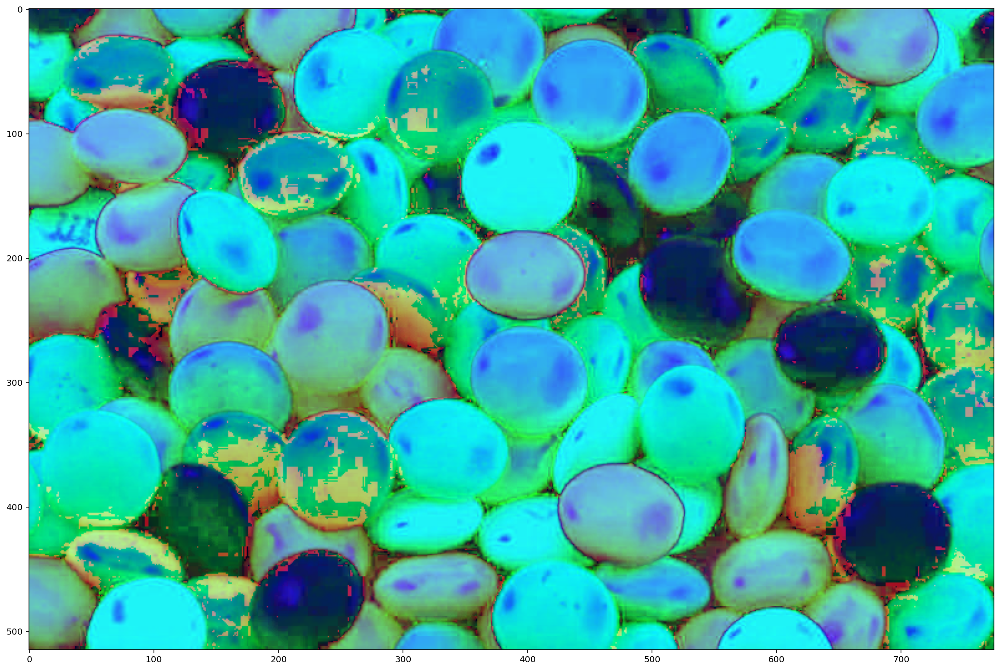

In [8]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
plt.figure(figsize = (20,15));
#plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2HSV));

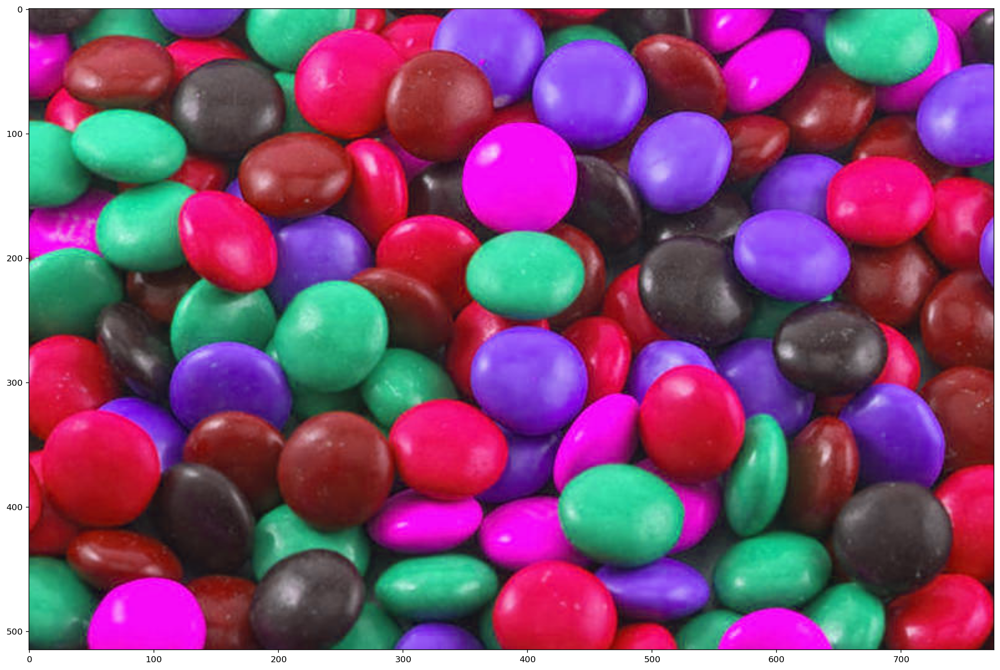

In [10]:

# Split the H,S and V channels 
H,S,V = cv2.split(img)
#b = cv2.add(b, 100) 
merged = cv2.merge([S,H,V])
imshow(merged)

[Hint](# "cv2.cvtColor") 

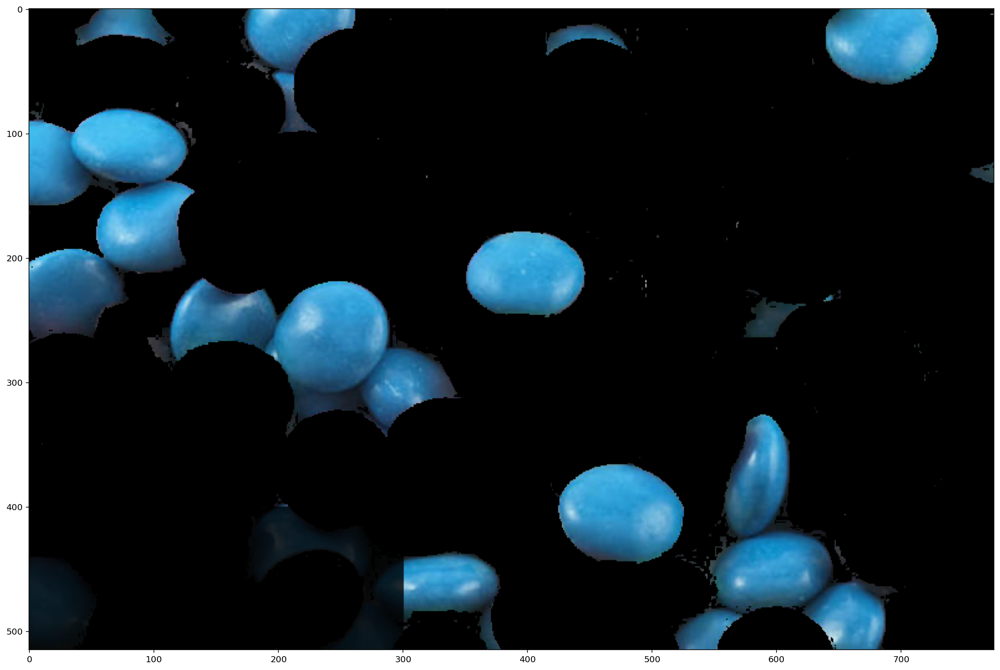

In [18]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image

#imshow(img)
hsv_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
masked_img = img.copy()

upper_range = (135,255,255) 
lower_range = (90,0, 0)

mask = cv2.inRange(hsv_img, lower_range, upper_range)
masked_img[mask==0] = [0,0,0]
imshow(masked_img)

In [ ]:
imshow(img)

[Hint](# "cv2.inRange") 

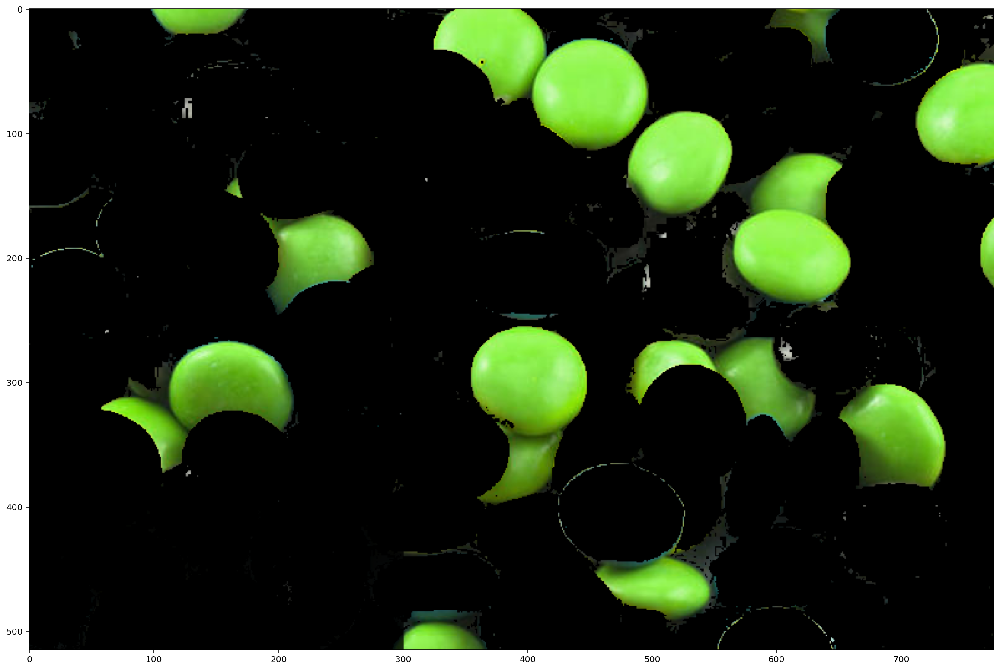

In [19]:
# Repeat the same but now with the greens

hsv_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
masked_img = img.copy()

upper_range = (90,255,255) 
lower_range = (35,0, 0)

mask = cv2.inRange(hsv_img, lower_range, upper_range)
masked_img[mask==0] = [0,0,0]
imshow(masked_img)

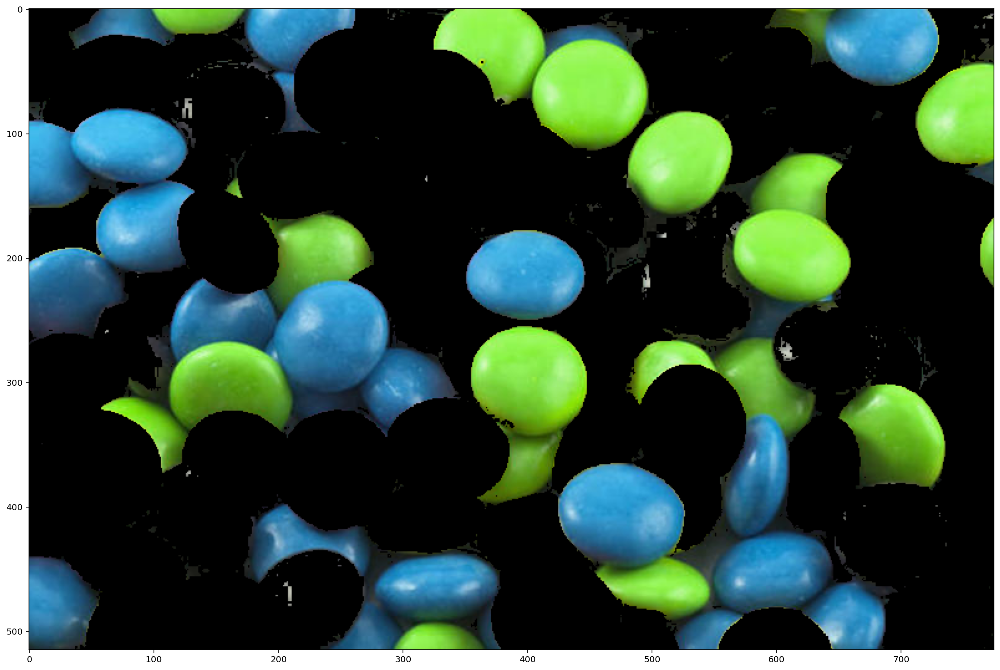

In [25]:
# Now combine both masks togheter so we can see all greens and blues in the same image!


hsv_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
masked_img = img.copy()

upper_range = (135,255,255) 
lower_range = (35,0, 0)

mask = cv2.inRange(hsv_img, lower_range, upper_range)
masked_img[mask==0] = [0,0,0]
imshow(masked_img)

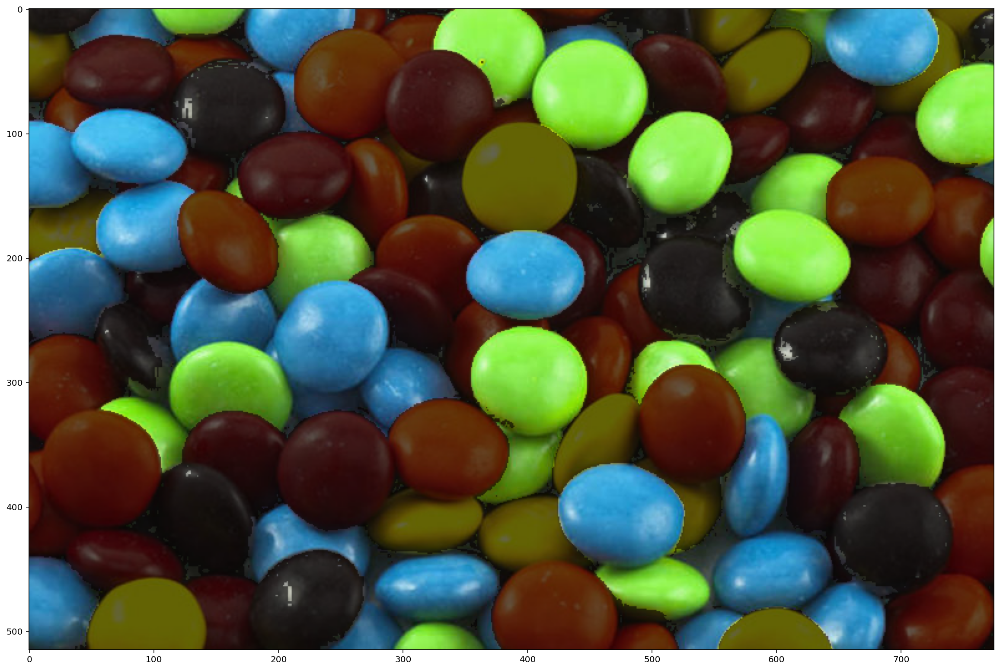

In [30]:


# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image
img = cv2.imread('img/m.jpg')

img_copy = masked_img.copy()



opacity = 0.4

beta = 1 - opacity

img2 = cv2.addWeighted(img,opacity,img_copy,beta,0)


imshow(img2)

In [14]:
imshow(img_copy)

NameError: name 'img_copy' is not defined

[Hint](# "cv2.addWeighted") 

In [ ]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

In [33]:
low_orange = np.array([95,0,0])
high_orange = np.array([130,255,255])

cap = cv2.VideoCapture(0)

while True:
    ret,frame = cap.read()
    cv2.imshow('Original frame',frame)

    hsv = cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)

    mask = cv2.inRange(hsv,low_orange,high_orange)
    cv2.imshow('Masked frame',mask)

    if cv2.waitKey(1) == ord('q'):
        break



cap.release()
cv2.destroyAllWindows()

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?